# Import et chargement des données

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels
#import geopandas as gpd

In [2]:
df_locations = pd.read_csv('Donnes/ech_annonces_locations_68.csv', sep=';', index_col='idannonce')
df_ventes = pd.read_csv('Donnes/ech_annonces_ventes_68.csv', sep=';', index_col='idannonce')

# 68 => Département du Haut-Rhin (Colmar)

# Variables numériques / catégorielles

In [ ]:
df_locations.info()

In [ ]:
df_ventes.info()

In [ ]:
df_locations.describe()

In [ ]:
df_ventes.describe()

## type_annonceur

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
fig.suptitle('countplot de la variable type_annonceur')

sns.countplot(ax= axes[0], y='type_annonceur', data=df_locations, hue='type_annonceur')
axes[0].set_ylabel("Locations : type_annonceur")

sns.countplot(ax= axes[1], y='type_annonceur', data=df_ventes, hue='type_annonceur')
axes[1].set_ylabel("Ventes : type_annonceur")
;

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
fig.suptitle('countplot de la variable typedebien')

sns.countplot(ax= axes[0], y='typedebien', data=df_locations, hue='typedebien')
axes[0].set_ylabel("Locations : typedebien")

sns.countplot(ax= axes[1], y='typedebien', data=df_ventes, hue='typedebien')
axes[1].set_ylabel("Ventes : typedebien")
;

In [ ]:
fig, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
fig.suptitle('countplot de la variable typedetransaction')

sns.countplot(ax= axes[0], y='typedetransaction', data=df_locations, hue='typedetransaction')
axes[0].set_ylabel("Locations : typedetransaction")

sns.countplot(ax= axes[1], y='typedetransaction', data=df_ventes, hue='typedetransaction')
axes[1].set_ylabel("Ventes : typedetransaction")
;

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('violinplot de la variable etage')

sns.violinplot(x='typedebien', y='etage', data=df_locations, ax= axes[0])
axes[0].set_title("Locations : etage")

sns.violinplot(x='typedebien', y='etage', data=df_ventes, ax= axes[1])
axes[1].set_title("Ventes : etage")
;

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('violinplot de la variable etage')

sns.violinplot(x='typedebien', y='etage', data=df_locations[df_locations.etage < 10], ax= axes[0])
axes[0].set_title("Locations : etage")

sns.violinplot(x='typedebien', y='etage', data=df_ventes[df_ventes.etage < 10], ax= axes[1])
axes[1].set_title("Ventes : etage")
;

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
fig.suptitle('violinplot de la variable surface')

sns.violinplot(df_locations.surface, ax= axes[0])
axes[0].set_xlabel("Locations : surface")

sns.violinplot(df_ventes.surface, ax= axes[1])
axes[1].set_xlabel("Ventes : surface")
;

In [ ]:
sns.displot(df_locations.surface)

sns.displot(df_ventes.surface)

In [ ]:
sns.lmplot(x="surface", y="prix_bien", data=df_locations, hue="typedebien")

In [ ]:
sns.displot(df_locations.surface_terrain)

sns.displot(df_ventes.surface_terrain)

In [ ]:
sns.displot(df_locations.nb_pieces)

sns.displot(df_ventes.nb_pieces)

In [ ]:
sns.catplot(x='prix_bien', data=df_locations, kind='box')
sns.displot(df_locations.prix_bien)

In [ ]:
sns.catplot(x='mensualiteFinance', data=df_locations, kind='box')
sns.displot(df_locations.mensualiteFinance)

In [ ]:
sns.catplot(x='balcon', data=df_locations, kind='box')
sns.displot(df_locations.balcon)

In [ ]:
sns.catplot(x='eau', data=df_locations, kind='box')
sns.displot(df_locations.eau)

In [ ]:
sns.catplot(x='bain', data=df_locations, kind='box')
sns.displot(df_locations.bain)

In [ ]:
sns.catplot(x='dpeL', data=df_locations, kind='count', hue='dpeL')

In [ ]:
sns.catplot(x='dpeC', data=df_locations, kind='box')
sns.displot(df_locations.dpeC)

# Variables géographiques

In [ ]:
min_lat = df_locations['mapCoordonneesLatitude'].min()
max_lat = df_locations['mapCoordonneesLatitude'].max()
min_lon = df_locations['mapCoordonneesLongitude'].min()
max_lon = df_locations['mapCoordonneesLongitude'].max()


In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

small_df_locations = df_locations[:]

location = [small_df_locations['mapCoordonneesLatitude'].mean(), small_df_locations['mapCoordonneesLongitude'].mean()]

min_lat = small_df_locations['mapCoordonneesLatitude'].min()
max_lat = small_df_locations['mapCoordonneesLatitude'].max()
min_lon = small_df_locations['mapCoordonneesLongitude'].min()
max_lon = small_df_locations['mapCoordonneesLongitude'].max()

# Créer la carte
m = folium.Map(
    location=location,
    tiles="Cartodb Positron",
    min_lat=min_lat,
    min_lon=min_lon,
    max_lat=max_lat,
    max_lon=max_lon,
    zoom_control=True,
    zoom_start=6
)

# Icons
iconMaison = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/5988/5988246.png",
    icon_size=(20,20)
)

iconAppart = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/6917/6917662.png",
    icon_size=(20,20)
)

# MarkerClusters directement ajoutés à la carte
marker_cluster = MarkerCluster().add_to(m)


# Ajout des marqueurs dans les clusters
for index, row in small_df_locations.iterrows():
    if row.typedebien == "a":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Appartement de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconAppart
        ).add_to(marker_cluster)
    elif row.typedebien == "m":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Maison de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconMaison
        ).add_to(marker_cluster)


m


In [ ]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster

small_df_locations = df_locations.copy()

location = [
    small_df_locations['mapCoordonneesLatitude'].mean(),
    small_df_locations['mapCoordonneesLongitude'].mean()
]

min_lat = small_df_locations['mapCoordonneesLatitude'].min()
max_lat = small_df_locations['mapCoordonneesLatitude'].max()
min_lon = small_df_locations['mapCoordonneesLongitude'].min()
max_lon = small_df_locations['mapCoordonneesLongitude'].max()

# Carte
m = folium.Map(
    location=location,
    tiles="Cartodb Positron",
    min_lat=min_lat, 
    min_lon=min_lon,
    max_lat=max_lat, 
    max_lon=max_lon,
    zoom_control=True, 
    zoom_start=6
)

# Icônes
iconMaison = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/5988/5988246.png",
    icon_size=(20,20)
)
iconAppart = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/6917/6917662.png",
    icon_size=(20,20)
)

# 1) Définissez vos catégories de prix (à adapter à votre marché)
bins = [-np.inf, 600, 900, 1200, np.inf]
labels = ["< 600 €", "600–900 €", "900–1200 €", "≥ 1200 €"]

# Catégorie de prix par bien
prix_cat = pd.cut(
    small_df_locations['prix_bien'].astype(float),
    bins=bins, labels=labels, include_lowest=True
)

# 2) Créez un FeatureGroup (layer) par tranche, avec un cluster interne
layers = {}
clusters = {}
all_labels = labels# + ["Prix inconnu"]  # pour gérer les NaN
for lbl in all_labels:
    fg = folium.FeatureGroup(name=f"Loyer {lbl}", show=True).add_to(m)
    mc = MarkerCluster().add_to(fg)
    layers[lbl] = fg
    clusters[lbl] = mc

# 3) Ajoutez les marqueurs dans le cluster de la tranche correspondante
for idx, row in small_df_locations.iterrows():
    cat = prix_cat.loc[idx]
    cat_label = str(cat)# if pd.notna(cat)# else "Prix inconnu"

    icon = iconAppart if row.typedebien == "a" else iconMaison
    popup_txt = f"{'Appartement' if row.typedebien=='a' else 'Maison'} de {row.surface} m² ({row.prix_bien}€/mois)"

    folium.Marker(
        location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
        popup=popup_txt,
        icon=icon
    ).add_to(clusters[cat_label])

# 4) Contrôle des layers
folium.LayerControl(collapsed=False).add_to(m)

m


In [ ]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import MarkerCluster, FeatureGroupSubGroup

small_df_locations = df_locations.copy()

location = [
    small_df_locations['mapCoordonneesLatitude'].mean(),
    small_df_locations['mapCoordonneesLongitude'].mean()
]

m = folium.Map(location=location, tiles="Cartodb Positron", zoom_start=6)

# Icônes
iconMaison = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/5988/5988246.png",
    icon_size=(20,20)
)
iconAppart = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/6917/6917662.png",
    icon_size=(20,20)
)

# catégories de prix
bins = [-np.inf, 600, 900, 1200, np.inf]
labels = ["< 600 €", "600–900 €", "900–1200 €", "≥ 1200 €"]
prix_cat = pd.cut(
    small_df_locations['prix_bien'].astype(float),
    bins=bins, labels=labels, include_lowest=True
)

# nettoyage / libellés pour typedebien
small_df_locations['typedebien_clean'] = small_df_locations['typedebien'].fillna('inconnu').astype(str)
type_values = sorted(small_df_locations['typedebien_clean'].unique())

# fonction pour nom lisible
def nice_type(t):
    if t == 'a':
        return 'Appartement'
    if t == 'm':
        return 'Maison'
    if t == 'l':
        return 'Inconnu'
    return str(t)

# dictionnaire pour garder les sous-couches
subgroups = {}

for lbl in labels:
    # FeatureGroup parent (nommé) — c'est lui qui apparaîtra dans le LayerControl si souhaité
    fg_parent = folium.FeatureGroup(name=f"Loyer {lbl}",control=False).add_to(m)
    # MarkerCluster ajouté DANS le FeatureGroup parent (pas directement sur la carte)
    parent_mc = MarkerCluster().add_to(fg_parent)

    # créer les sous-groupes (un par type) ; NOTE: on ajoute la sous-couche à la MAP
    # et on donne un nom unique pour chaque combinaison (pour éviter collisions dans LayerControl)
    for t in type_values:
        sg_name = f"Loyer {lbl} — {nice_type(t)}"
        sg = FeatureGroupSubGroup(parent_mc, sg_name).add_to(m)
        subgroups[(lbl, t)] = sg

# Ajout des marqueurs
for idx, row in small_df_locations.iterrows():
    cat = prix_cat.loc[idx]
    if pd.isna(cat):
        continue  # ou gérer les prix inconnus
    cat_label = str(cat)
    t = row['typedebien_clean']

    icon = iconAppart if row['typedebien'] == "a" else iconMaison
    popup_txt = f"{nice_type(t)} de {row.get('surface', '?')} m² ({row.get('prix_bien', '?')} €/mois)"

    folium.Marker(
        location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
        popup=popup_txt,
        icon=icon
    ).add_to(subgroups[(cat_label, t)])

# Layer control
folium.LayerControl(collapsed=False).add_to(m)

m


In [ ]:
sns.catplot(x='prix_bien', data=df_locations, kind='box')
sns.displot(df_locations.prix_bien)

In [ ]:
for typedebien in df_locations.typedebien.unique():
    sns.displot(x="prix_bien", data=df_locations[df_locations.typedebien == typedebien], bins=50, kde=True, rug=True, hue="typedebien")


# Point d'avancement

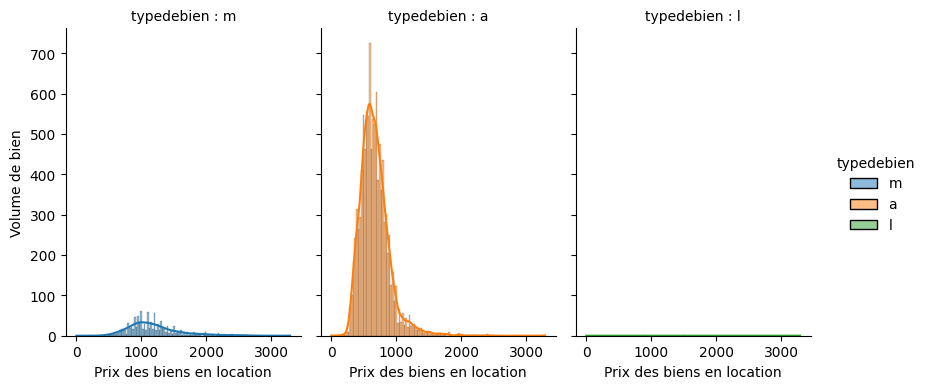

In [3]:
# Locations


g = sns.displot(
    data=df_locations, x="prix_bien", col="typedebien", hue="typedebien",
    kde=True, height=4, aspect=.7,
)
g.set_axis_labels("Prix des biens en location", "Volume de bien")
g.set_titles("typedebien : {col_name}")

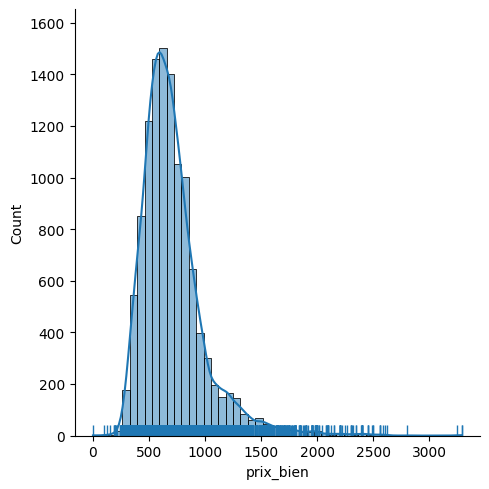

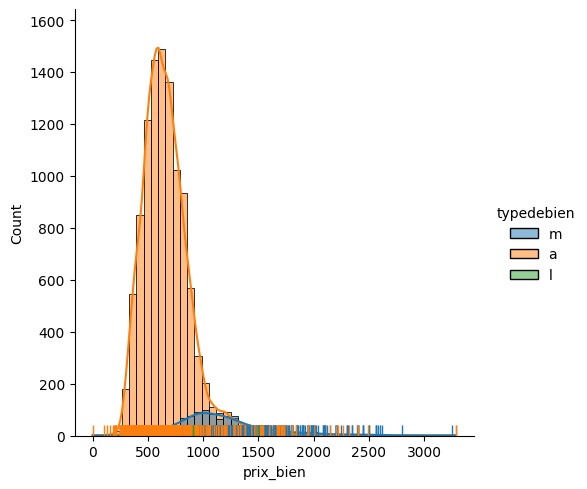

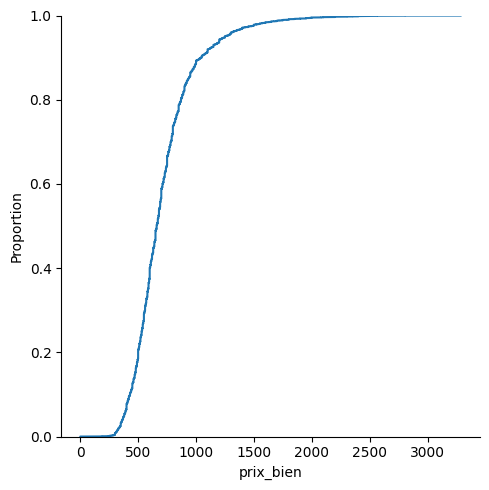

In [4]:
# Locations
sns.displot(x="prix_bien", data=df_locations, bins=50, kde=True, rug=True)
sns.displot(x="prix_bien", data=df_locations, bins=50, kde=True, rug=True, hue="typedebien")
sns.displot(df_locations.prix_bien, kind='ecdf')


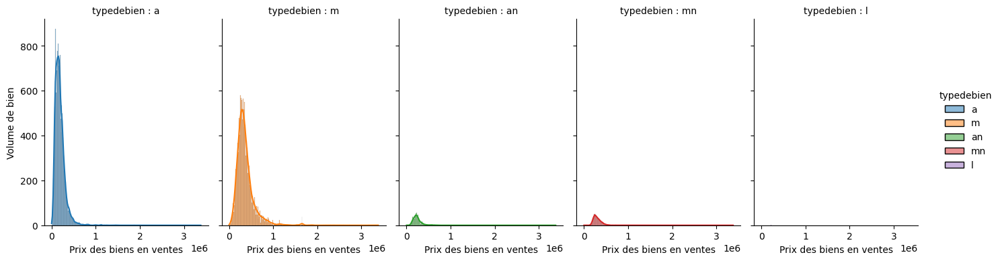

In [5]:
# Ventes

g = sns.displot(
    data=df_ventes, x="prix_bien", col="typedebien", hue="typedebien",
    kde=True, height=4, aspect=.7,
)
g.set_axis_labels("Prix des biens en ventes", "Volume de bien")
g.set_titles("typedebien : {col_name}")

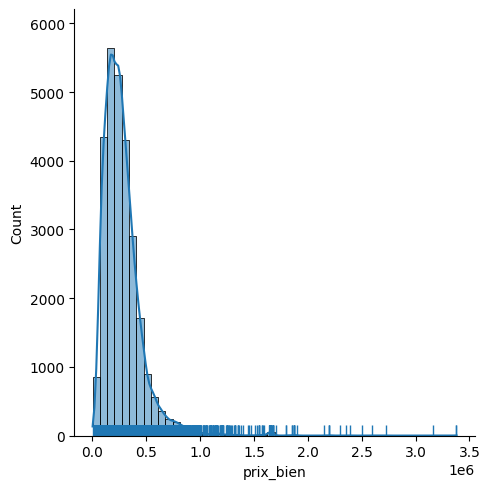

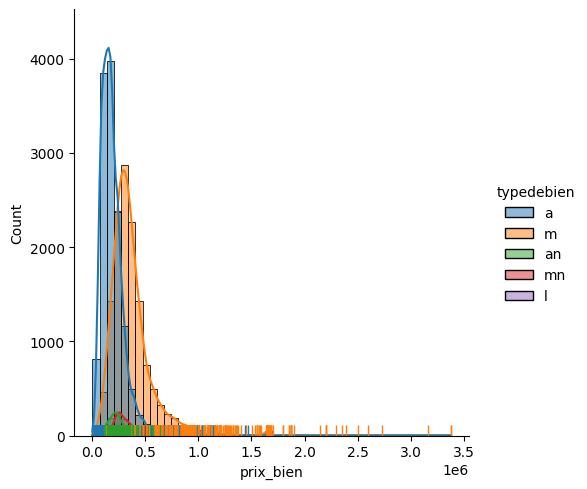

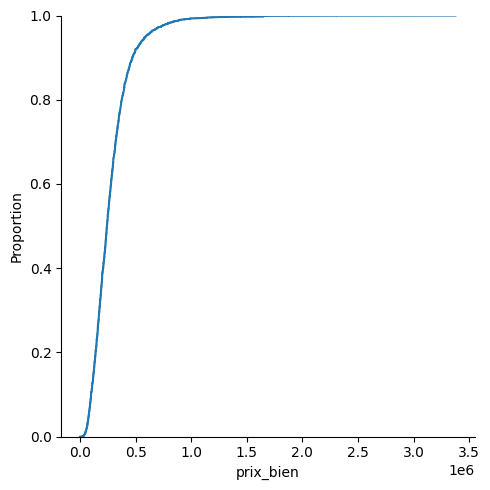

In [6]:
# Ventes
sns.displot(x="prix_bien", data=df_ventes, bins=50, kde=True, rug=True)
sns.displot(x="prix_bien", data=df_ventes, bins=50, kde=True, rug=True, hue="typedebien")
sns.displot(df_ventes.prix_bien, kind='ecdf')


In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

small_df_locations = df_locations[:]

location = [small_df_locations['mapCoordonneesLatitude'].mean(), small_df_locations['mapCoordonneesLongitude'].mean()]

min_lat = small_df_locations['mapCoordonneesLatitude'].min()
max_lat = small_df_locations['mapCoordonneesLatitude'].max()
min_lon = small_df_locations['mapCoordonneesLongitude'].min()
max_lon = small_df_locations['mapCoordonneesLongitude'].max()

# Créer la carte
m = folium.Map(
    location=location,
    tiles="Cartodb Positron",
    min_lat=min_lat,
    min_lon=min_lon,
    max_lat=max_lat,
    max_lon=max_lon,
    zoom_control=True,
    zoom_start=6
)

# Icons
iconMaison = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/5988/5988246.png",
    icon_size=(20,20)
)

iconAppart = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/6917/6917662.png",
    icon_size=(20,20)
)

# MarkerClusters directement ajoutés à la carte
marker_cluster = MarkerCluster().add_to(m)


# Ajout des marqueurs dans les clusters
for index, row in small_df_locations.iterrows():
    if row.typedebien == "a":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Appartement de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconAppart
        ).add_to(marker_cluster)
    elif row.typedebien == "m":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Maison de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconMaison
        ).add_to(marker_cluster)


m

In [8]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

small_df_locations = df_locations[:]

location = [small_df_locations['mapCoordonneesLatitude'].mean(), small_df_locations['mapCoordonneesLongitude'].mean()]

min_lat = small_df_locations['mapCoordonneesLatitude'].min()
max_lat = small_df_locations['mapCoordonneesLatitude'].max()
min_lon = small_df_locations['mapCoordonneesLongitude'].min()
max_lon = small_df_locations['mapCoordonneesLongitude'].max()

# Créer la carte
m = folium.Map(
    location=location,
    tiles="Cartodb Positron",
    min_lat=min_lat,
    min_lon=min_lon,
    max_lat=max_lat,
    max_lon=max_lon,
    zoom_control=True,
    zoom_start=6
)

# Icons
iconMaison = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/5988/5988246.png",
    icon_size=(20,20)
)

iconAppart = folium.CustomIcon(
    icon_image="https://cdn-icons-png.flaticon.com/512/6917/6917662.png",
    icon_size=(20,20)
)

# MarkerClusters directement ajoutés à la carte
marker_cluster = MarkerCluster().add_to(m)


# Ajout des marqueurs dans les clusters
for index, row in small_df_locations.iterrows():
    if row.typedebien == "a":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Appartement de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconAppart
        ).add_to(marker_cluster)
    elif row.typedebien == "m":
        folium.Marker(
            location=[row['mapCoordonneesLatitude'], row['mapCoordonneesLongitude']],
            popup="Maison de " + str(row.surface) + " m² (" + str(row.prix_bien) + "€/mois)",
            icon=iconMaison
        ).add_to(marker_cluster)


m